# Notebook: NxTransit basic examples

Chingiz Zhanarbaev, 02.2024

This notebook demonstrates the main features of the [NxTransit](https://github.com/chingiztob/Transit) library. In this notebook, we will perform basic operations with Belgrade public transportation data.

In [1]:
import random

import contextily
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
import shapely.geometry

import nxtransit as nt

## Prepare the data

### Initialize graph

The first step is to initialize a graph object. Transit graph is a `nx.DiGraph` object and contains spetial attributes for handling dynamic nature of GTFS data.

In [2]:
# Setting up the parameters

GTFSpath = r"data\Belgrade" # Path to the folder with GTFS files
departure_time_input = "6:00:00" # Departure time in HH:MM:SS format
day = 'monday' # Day of the week

### Validate Feed

In [3]:
nt.validate_feed(GTFSpath)

GTFS feed is valid.


True

In [ ]:
transit_graph = nt.feed_to_graph(
    GTFSpath = GTFSpath, 
    day_of_week = day, 
    departure_time_input = departure_time_input,
    duration_seconds=3600*18,
    read_shapes=True,
    multiprocessing=True,
    )

## Find shortest path in time-dependent graph

### Select two random points for the example

In [35]:
source = random.choice(list(transit_graph.nodes))
target = random.choice(list(transit_graph.nodes))

print("Source: ", source, "coordinates", transit_graph.nodes[source]['y'], transit_graph.nodes[source]['x'])
print("Target: ", target, "coordinates", transit_graph.nodes[target]['y'], transit_graph.nodes[target]['x'])

Source:  6345891314 coordinates 44.7528755 20.4508862
Target:  9828736356 coordinates 44.8135192 20.389705


### Find a route between two points

In [36]:
path, arrival_time, travel_time, used_routes = nt.time_dependent_dijkstra(
                            graph = transit_graph, 
                            source = source, 
                            target = target, 
                            start_time = nt.parse_time_to_seconds("12:00:00"),
                            )

print('Used routes:', used_routes)
print(f"Arrival time at destination: {nt.parse_seconds_to_time(arrival_time)} in {nt.parse_seconds_to_time(travel_time)}")

Used routes: {None, '1047-10003', '1047-00094', '1047-00085'}
Arrival time at destination: 13:09:10 in 01:09:10


### Vizualize the route using folium

In [37]:
G_path = nx.subgraph(transit_graph, path)
graph = nx.MultiDiGraph(G_path)

G_nodes, G_edges = ox.graph_to_gdfs(graph)

G_nodes.explore(column = 'type',
                cmap = 'rainbow',
                tiles = 'cartodbpositron',
                )

### Calculate shortest path between source node and all other nodes

In [8]:
arrival_times, predecessors, travel_times = nt.single_source_time_dependent_dijkstra(
    graph = transit_graph, source = source, 
    start_time = nt.parse_time_to_seconds("12:00:00")
    )

In [9]:
print("Travel times: ", nt.parse_seconds_to_time(travel_times[target]))

Travel times:  00:49:25


### Separate pedestrian time from transit time

In [10]:
separated_df = nt.separate_travel_times(transit_graph, predecessors, travel_times, source)

100%|██████████| 77486/77486 [00:03<00:00, 24041.60it/s]


In [11]:
print(separated_df.head(10))
print(separated_df[separated_df['node'] == target])

      node  transit_time  pedestrian_time
0   1047-1   1894.492086       925.507914
1   1047-2   1548.987744      1193.869784
2   1047-3   1834.492086       925.507914
3   1047-4   1540.912850      1007.070504
4   1047-5   1543.234253       925.507914
5   1047-6   1949.875242       786.887050
6   1047-7   1912.433813       727.566187
7   1047-8   1417.830665      1105.280576
8   1047-9   1732.433813       727.566187
9  1047-10   1563.557346       794.597122
             node  transit_time  pedestrian_time
18445  2131385556   1846.523449      1118.561871


## Analyze latest service time at the stops

### Calculate latest service time at each stop

In [38]:
nt.last_service(transit_graph)
graph = nx.MultiDiGraph(transit_graph)

G_nodes, G_edges = ox.graph_to_gdfs(graph)
filtered_nodes = G_nodes[G_nodes['type'] == 'transit']

print(filtered_nodes['last_service'].describe())

filtered_nodes.explore(column = 'last_service', cmap = 'gnuplot', 
                       legend = True, 
                       tooltip = ['last_service'],
                       legend_kwds=dict(colorbar=False, 
                                        title='last serivce time in seconds',
                                        ),
                       scheme = 'Quantiles', k = 6,
                       tiles = 'cartodbpositron')

count     3051.000000
mean     84610.993117
std       3088.717432
min      59340.000000
25%      84600.000000
50%      85680.000000
75%      86160.000000
max      86400.000000
Name: last_service, dtype: float64


### Show stops which are not served after 8 pm

In [39]:
filtered_nodes = G_nodes[(G_nodes['type'] == 'transit') & (G_nodes['last_service'] <= 82800)]

filtered_nodes.explore(column='last_service', 
                       cmap='gnuplot', 
                       legend=True, 
                       tooltip=['last_service'],
                       legend_kwds=dict(colorbar=False, 
                                        title='last service time in seconds'
                                        ),
                       scheme='Quantiles', 
                       k=6,
                       tiles='cartodbpositron')

## Service areas analysis

### Calculate classic service areas for the given time

In [21]:
sa_source = 9908603347
departure = nt.parse_time_to_seconds(departure_time_input)

polygon = nt.service_area(transit_graph, sa_source, start_time=departure, cutoff = 2700, buffer_radius=100)
polygon2 = nt.service_area(transit_graph, sa_source, start_time=departure, cutoff = 1800, buffer_radius=100)

In [15]:
stops = nt.load_stops_gdf(GTFSpath)

In [43]:
frame_center_lat = stops['stop_lat'].mean()
frame_center_lon = stops['stop_lon'].mean()

m = folium.Map(location=[transit_graph.nodes[sa_source]['y'], 
                         transit_graph.nodes[sa_source]['x']], 
                zoom_start=12,
                width='100%', 
                height='100%',
                tiles = 'cartodbvoyager')

polygon.explore(m = m)
polygon2.explore(m = m, color = 'green')

### Calculate "typical" service area reachable with specified chance

In [26]:
end_time = departure + 7200

polygon_pa = nt.percent_access_service_area(
    transit_graph, sa_source, 
    start_time=departure, 
    end_time= end_time,
    sample_interval=600, 
    cutoff = 2700, 
    buffer_radius=100,
    threshold=0.7,
    )

In [44]:
polygon_pa.explore(color = 'red', tiles = 'cartodb_voyager')

## Frequency analysis

### Calculate edge frequencies and plot results with contextily basemaps

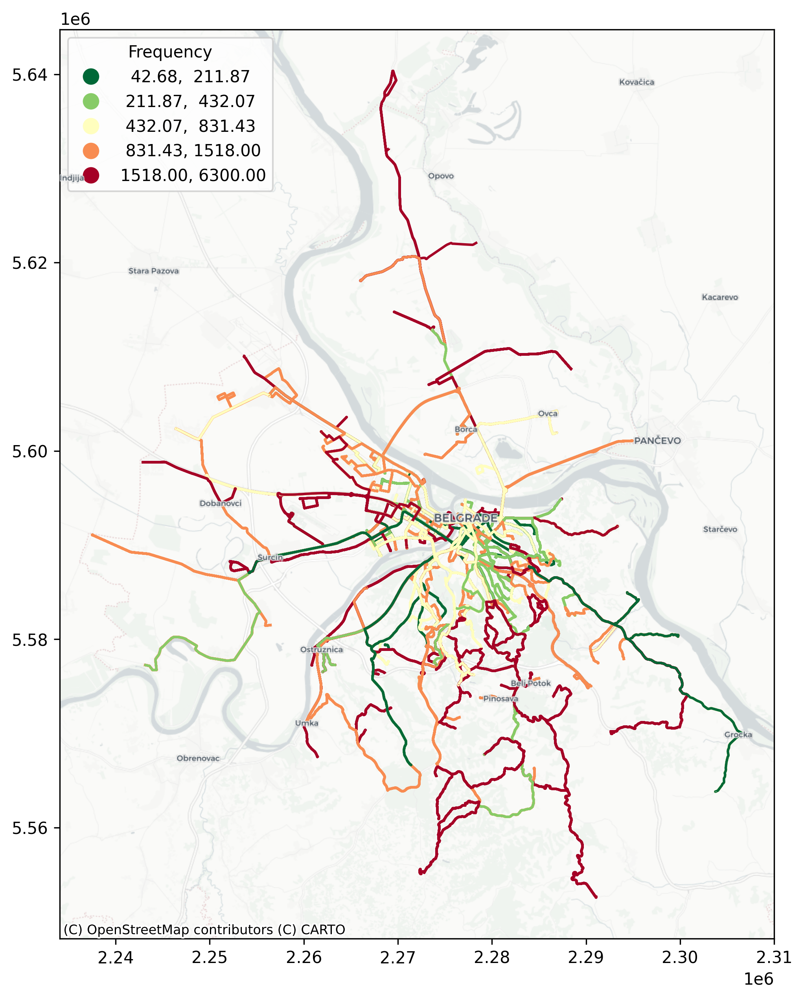

In [56]:
nt.edge_frequency(transit_graph, 20000, 68000)

graph = nx.MultiDiGraph(transit_graph)
_, G_edges2 = ox.graph_to_gdfs(graph)

filtered_edges = G_edges2[G_edges2["type"] == "transit"].to_crs(epsg=3857)

fig, ax = plt.subplots(1, figsize=(12, 10))
filtered_edges.plot(
    column="frequency",
    ax=ax,
    scheme="quantiles",
    k=5,
    cmap="RdYlGn_r",
    legend=True,
    legend_kwds=dict(loc="upper left", title="Frequency"),
)
fig.dpi = 300

contextily.add_basemap(
    ax, crs=filtered_edges.crs, source=contextily.providers.CartoDB.Positron
)
contextily.add_basemap(
    ax, crs=filtered_edges.crs, source=contextily.providers.CartoDB.PositronOnlyLabels
)

### Calculate node frequencies

In [47]:
nt.node_frequency(transit_graph, start_time=10000, end_time=86400)

G_combined3 = nx.MultiDiGraph(transit_graph)
G_nodes3, _ = ox.graph_to_gdfs(G_combined3)

filtered_nodes = G_nodes3[G_nodes3["type"] == "transit"]

filtered_nodes.explore(
    column="frequency",
    cmap="gnuplot",
    legend=True,
    tooltip=["frequency"],
    legend_kwds=dict(
        colorbar=False,
        title="Frequency",
    ),
    scheme="Quantiles",
    k=6,
    tiles="cartodbpositron",
)

100%|██████████| 77486/77486 [00:00<00:00, 163639.34it/s]
